In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [6]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [4]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [21]:
train.shape

(1460, 81)

In [8]:
test.shape

(1459, 80)

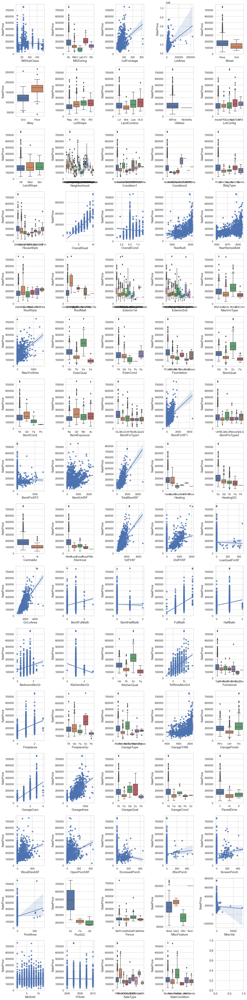

In [50]:
def plot_scatter(df, target_col):
    num_cols = 5
    num_rows = math.ceil(len(df.columns)/num_cols)
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 4*num_rows))
    sns.set(font_scale=1.2, style='whitegrid')
    for i, col_name in enumerate(df.columns):
        if col_name != target_col.name:
            ax = axes[i // num_cols, i % num_cols]
            
            if df[col_name].dtype == "O":
                sns.boxplot(x=df[col_name], y=target_col, ax=ax)
            else:
                sns.regplot(x=df[col_name], y=target_col, ax=ax)
            ax.set_xlabel(col_name, fontsize=14)
            ax.set_ylabel(target_col.name, fontsize=14)
            ax.tick_params(axis='both', which='major', labelsize=12)
    plt.tight_layout()
    plt.show()
    
plot_scatter(train.drop('Id',axis=1),train.SalePrice)

# LotFrontage, LotArea, Alley, OverallQual, YearBuilt, YearRemodAdd, MasVnrArea, ExterQual, BsmtFinSF1, TotalBsmtSF,
#HeadingQC, CentralAir, 1stFlrSF, GrLivArea, FullBath, TotRmsAbvGrd, GarageArea, SaleCondition

<AxesSubplot:>

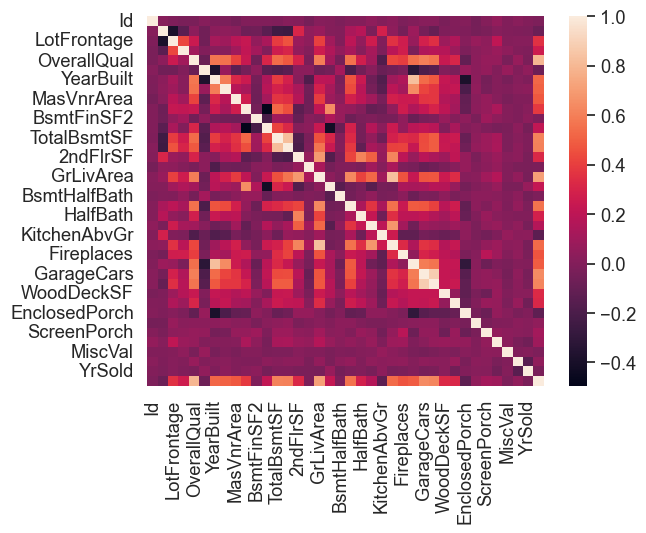

In [48]:
sns.heatmap(train.corr())

In [96]:
extraction1 = train[['LotFrontage', 'LotArea', 'Street', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 
                           'MasVnrArea', 'ExterQual', 'BsmtFinSF1', 'TotalBsmtSF', 'HeatingQC', 'CentralAir', 
                           '1stFlrSF', 'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'GarageArea', 'SaleCondition', 
                           'SalePrice']]

In [97]:
extraction1.head()

,LotFrontage,LotArea,Street,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,BsmtFinSF1,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageArea,SaleCondition,SalePrice
0,65.0,8450,Pave,7,2003,2003,196.0,Gd,706,856,Ex,Y,856,1710,2,8,548,Normal,208500
1,80.0,9600,Pave,6,1976,1976,0.0,TA,978,1262,Ex,Y,1262,1262,2,6,460,Normal,181500
2,68.0,11250,Pave,7,2001,2002,162.0,Gd,486,920,Ex,Y,920,1786,2,6,608,Normal,223500
3,60.0,9550,Pave,7,1915,1970,0.0,TA,216,756,Gd,Y,961,1717,1,7,642,Abnorml,140000
4,84.0,14260,Pave,8,2000,2000,350.0,Gd,655,1145,Ex,Y,1145,2198,2,9,836,Normal,250000


In [98]:
extraction1['HeatingQC'] = extraction1.loc[:,'HeatingQC'].apply(lambda x: 'H_' + x)

/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/2233565789.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extraction1['HeatingQC'] = extraction1.loc[:,'HeatingQC'].apply(lambda x: 'H_' + x)


<AxesSubplot:>

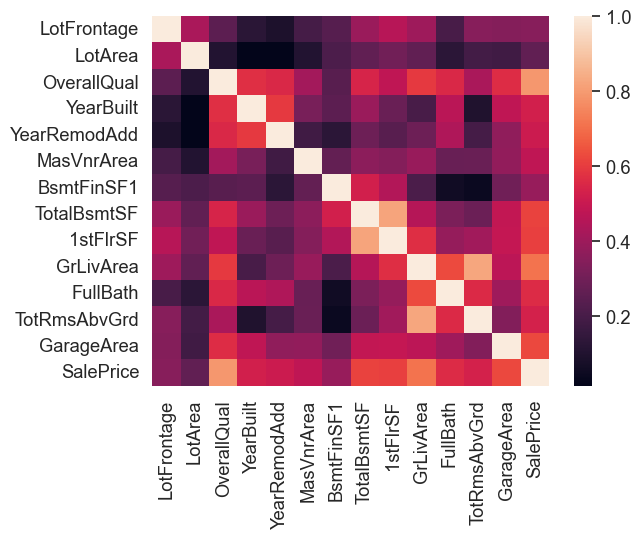

In [99]:
sns.heatmap(extraction1.corr())

In [100]:
def getdummies_(df):
    for col_name in df:
        if df[col_name].dtype == 'O':
            df = df.join(pd.get_dummies(df[col_name]))
            df = df.drop(col_name,axis=1)
    return df
extraction1_ohe = getdummies_(extraction1)

In [101]:
extraction1_ohe.isna().sum()

LotFrontage     259
LotArea           0
OverallQual       0
YearBuilt         0
YearRemodAdd      0
MasVnrArea        8
BsmtFinSF1        0
TotalBsmtSF       0
1stFlrSF          0
GrLivArea         0
FullBath          0
TotRmsAbvGrd      0
GarageArea        0
SalePrice         0
Grvl              0
Pave              0
Ex                0
Fa                0
Gd                0
TA                0
H_Ex              0
H_Fa              0
H_Gd              0
H_Po              0
H_TA              0
N                 0
Y                 0
Abnorml           0
AdjLand           0
Alloca            0
Family            0
Normal            0
Partial           0
dtype: int64

In [102]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')
extraction1_ohe['LotFrontage'] = imputer.fit_transform(extraction1_ohe['LotFrontage'].values.reshape(-1,1))[:,0] 
extraction1_ohe['MasVnrArea'] = imputer.fit_transform(extraction1_ohe['MasVnrArea'].values.reshape(-1,1))[:,0] 

In [105]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(extraction1_ohe.drop('SalePrice',axis=1),
                                                 extraction1_ohe.SalePrice,
                                                 random_state=42)

In [106]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

#Build the model
reg = xgb.XGBRegressor(base_score=0.5,    
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[22:18:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:195845.52701	validation_1-rmse:195374.72131
[99]	validation_0-rmse:80379.10047	validation_1-rmse:83860.22905


XGBRegressor(base_score=0.5, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [120]:
from sklearn.model_selection import GridSearchCV

param_grid = {
     'max_depth':  [3,4,5,6],
     'learning_rate': [0.1,0.01,0.05],
     'gamma': [0,0.25,1.0],
     'reg_lambda': [0,1.0,10.0],
     'n_estimators': [1000],
     'min_child_weight': [10,50,100]
 }

optimal_params = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror',
                                seed=42
                              ), 
    param_grid=param_grid,
    n_jobs=10,
    cv=3
)


optimal_params.fit(X_train,
                   y_train,
                   eval_set=[(X_test,y_test)],
                   verbose=False)

print(optimal_params.best_params_)
#{'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 1000, 'reg_lambda': 1.0}

{'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 1000, 'reg_lambda': 1.0}


In [122]:
reg = xgb.XGBRegressor(objective='reg:squarederror', 
                            seed=42,
                            learning_rate=0.05,
                            max_depth=3,
                            reg_lambda=1.0,
                            n_estimators=1000,
                            min_child_weight=10) 
reg.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=10, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [174]:
extraction_test = test[['LotFrontage', 'LotArea', 'Street', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 
                        'MasVnrArea', 'ExterQual', 'BsmtFinSF1', 'TotalBsmtSF', 'HeatingQC', 'CentralAir', 
                        '1stFlrSF', 'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'GarageArea', 'SaleCondition', ]]

In [175]:
extraction_test.head()

,LotFrontage,LotArea,Street,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,BsmtFinSF1,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageArea,SaleCondition
0,80.0,11622,Pave,5,1961,1961,0.0,TA,468.0,882.0,TA,Y,896,896,1,5,730.0,Normal
1,81.0,14267,Pave,6,1958,1958,108.0,TA,923.0,1329.0,TA,Y,1329,1329,1,6,312.0,Normal
2,74.0,13830,Pave,5,1997,1998,0.0,TA,791.0,928.0,Gd,Y,928,1629,2,6,482.0,Normal
3,78.0,9978,Pave,6,1998,1998,20.0,TA,602.0,926.0,Ex,Y,926,1604,2,7,470.0,Normal
4,43.0,5005,Pave,8,1992,1992,0.0,Gd,263.0,1280.0,Ex,Y,1280,1280,2,5,506.0,Normal


In [176]:
extraction_test['HeatingQC'] = extraction_test.loc[:,'HeatingQC'].apply(lambda x: 'H_' + x)

/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/2944406247.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extraction_test['HeatingQC'] = extraction_test.loc[:,'HeatingQC'].apply(lambda x: 'H_' + x)


In [177]:
def getdummies_(df):
    for col_name in df:
        if df[col_name].dtype == 'O':
            df = df.join(pd.get_dummies(df[col_name]))
            df = df.drop(col_name,axis=1)
    return df
extraction_test_ohe = getdummies_(extraction_test)

In [180]:
imputer = SimpleImputer(strategy='mean')
extraction_test_ohe['LotFrontage'] = imputer.fit_transform(extraction_test_ohe['LotFrontage'].values.reshape(-1,1))[:,0] 
extraction_test_ohe['MasVnrArea'] = imputer.fit_transform(extraction_test_ohe['MasVnrArea'].values.reshape(-1,1))[:,0]
extraction_test_ohe['BsmtFinSF1'] = imputer.fit_transform(extraction_test_ohe['BsmtFinSF1'].values.reshape(-1,1))[:,0] 
extraction_test_ohe['TotalBsmtSF'] = imputer.fit_transform(extraction_test_ohe['TotalBsmtSF'].values.reshape(-1,1))[:,0] 
extraction_test_ohe['GarageArea'] = imputer.fit_transform(extraction_test_ohe['GarageArea'].values.reshape(-1,1))[:,0] 



In [136]:
prediction = reg.predict(extraction_test_ohe)

In [135]:
ss = pd.read_csv('sample_submission.csv')
ss.head()

,Id,SalePrice
0,1461,169277.052498
1,1462,187758.393989
2,1463,183583.683570
3,1464,179317.477511
4,1465,150730.079977


In [137]:
submission = pd.DataFrame({'Id':test.Id.values,'SalePrice': prediction})

In [138]:
submission.head()

,Id,SalePrice
0,1461,139621.000000
1,1462,172924.218750
2,1463,179754.734375
3,1464,188595.312500
4,1465,193249.796875


In [141]:
submission.to_csv('housingprice_predict1.csv',index=False)

In [142]:
submission.shape

(1459, 2)

# 2nd submission

In [154]:
extraction1_ohe

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,...,H_Po,H_TA,N,Y,Abnorml,AdjLand,Alloca,Family,Normal,Partial
0,65.0,8450,7,2003,2003,196.0,706,856,856,1710,...,0,0,0,1,0,0,0,0,1,0
1,80.0,9600,6,1976,1976,0.0,978,1262,1262,1262,...,0,0,0,1,0,0,0,0,1,0
2,68.0,11250,7,2001,2002,162.0,486,920,920,1786,...,0,0,0,1,0,0,0,0,1,0
3,60.0,9550,7,1915,1970,0.0,216,756,961,1717,...,0,0,0,1,1,0,0,0,0,0
4,84.0,14260,8,2000,2000,350.0,655,1145,1145,2198,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917,6,1999,2000,0.0,0,953,953,1647,...,0,0,0,1,0,0,0,0,1,0
1456,85.0,13175,6,1978,1988,119.0,790,1542,2073,2073,...,0,1,0,1,0,0,0,0,1,0
1457,66.0,9042,7,1941,2006,0.0,275,1152,1188,2340,...,0,0,0,1,0,0,0,0,1,0
1458,68.0,9717,5,1950,1996,0.0,49,1078,1078,1078,...,0,0,0,1,0,0,0,0,1,0


In [156]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

In [169]:
clf_dt = DecisionTreeRegressor(random_state=42)
clf_dt = clf_dt.fit(X_train,y_train)

In [163]:
alpha_loop_value = []

for ccp_alpha in ccp_alphas:
    clf_dt = DecisionTreeRegressor(random_state=42,ccp_alpha=ccp_alpha)
    scores = cross_val_score(clf_dt, X_train, y_train, cv=5)
    alpha_loop_value.append([ccp_alpha, np.mean(scores), np.std(scores)])

#Visualizing the accuracy of different alpha based on results from cross validation
alpha_results = pd.DataFrame(alpha_loop_value, columns = ['alpha','mean_accuracy', 'std'])


In [182]:
prediction2 = clf_dt.predict(extraction_test_ohe)

In [183]:
submission2 = pd.DataFrame({'Id':test.Id.values,'SalePrice': prediction2})

In [185]:
submission2.to_csv('submission2.csv',index=False)

# Submission 3

https://www.youtube.com/watch?v=NQQ3DRdXAXE

In [238]:
df = pd.read_csv('train.csv')

In [199]:
def create_scrollable_table(df, table_id, title):
    html = f'<h3>{title}</h3>'
    html += f'<div id="{table_id}" style="height:200px; overflow:auto;">'
    html += df.to_html()
    html += '</div>'
    return html

In [204]:
import pandas as pd 
import numpy as np 
import plotly.graph_objects as go
import plotly.express as px
import scipy.stats as stats
from IPython.display import display, HTML
def create_scrollable_table(df, table_id, title):
    html = f'<h3>{title}</h3>'
    html += f'<div id="{table_id}" style="height:200px; overflow:auto;">'
    html += df.to_html()
    html += '</div>'
    return html

In [239]:
html_numerical = create_scrollable_table(df, 'train', 'Train dataframe')
display(HTML(html_numerical))

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

In [240]:
#Unique data types in the dataframe
set(df.dtypes)

{dtype('int64'), dtype('float64'), dtype('O')}

In [241]:
missing_values = pd.DataFrame(data=df.isna().sum(),columns=['NaN_count'])

In [242]:
na_sum = df.isna().sum()
na_sum = na_sum[na_sum>0]
na_sum = pd.DataFrame({'count': na_sum.values}, index=na_sum.index)

In [236]:
html_isna = create_scrollable_table(na_sum, 'missing_values', 'Number of missing values in each column')
display(HTML(html_isna))

,count
LotFrontage,259
Alley,1369
MasVnrType,8
MasVnrArea,8
BsmtQual,37
BsmtCond,37
BsmtExposure,38
BsmtFinType1,37
BsmtFinType2,38
Electrical,1


In [251]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin


In [243]:
# Define transformers for numerical and categorical columns
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse = False))
])

In [273]:
# Define transformers for numerical and categorical columns
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse = False))
])
# Update categorical and numerical columns
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Remove target variable from numerical columns
numerical_columns = numerical_columns.drop('SalePrice')

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)
    ],remainder = 'passthrough')

# Create a pipeline with the preprocessor
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)])

# Apply the pipeline to your dataset
X = df.drop('SalePrice', axis=1)
y = np.log(df['SalePrice']) #normalize dependent variable 
X_preprocessed = pipeline.fit_transform(X)

### Modelling

In [254]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)

In [256]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)

# Define the models
models = {
    'LinearRegression': LinearRegression(),
    'RandomForest': RandomForestRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42)
}

# Define the hyperparameter grids for each model
param_grids = {
    'LinearRegression': {},
    'RandomForest': {
        'n_estimators': [100, 200, 500],
        'max_depth': [None, 10, 30],
        'min_samples_split': [2, 5, 10],
    },
    'XGBoost': {
        'n_estimators': [100, 200, 500],
        'learning_rate': [0.01, 0.1, 0.3],
        'max_depth': [3, 6, 10],
    }
}

# 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Train and tune the models
grids = {}
for model_name, model in models.items():
    #print(f'Training and tuning {model_name}...')
    grids[model_name] = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=cv, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grids[model_name].fit(X_train, y_train)
    best_params = grids[model_name].best_params_
    best_score = np.sqrt(-1 * grids[model_name].best_score_)
    
    print(f'Best parameters for {model_name}: {best_params}')
    print(f'Best RMSE for {model_name}: {best_score}\n')

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for LinearRegression: {}
Best RMSE for LinearRegression: 707569363.2568831

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 500}
Best RMSE for RandomForest: 0.15343818029231399

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
Best RMSE for XGBoost: 0.13214809937538918

[CV] END .................................................... total time=   0.0s
[CV] END max_depth=None, min_samples_split=2, n_estimators=200; total time=   3.0s
[CV] END max_depth=None, min_samples_split=5, n_estimators=100; total time=   1.2s
[CV] END max_depth=None, min_samples_split=5, n_estimators=500; total time=   5.5s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END max_depth=10, min_samples_

[CV] END max_depth=None, min_samples_split=2, n_estimators=500; total time=   7.3s
[CV] END max_depth=None, min_samples_split=10, n_estimators=500; total time=   4.7s
[CV] END max_depth=10, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END max_depth=10, min_samples_split=5, n_estimators=200; total time=   2.0s
[CV] END max_depth=10, min_samples_split=10, n_estimators=100; total time=   1.2s
[CV] END max_depth=10, min_samples_split=10, n_estimators=200; total time=   2.0s
[CV] END max_depth=30, min_samples_split=2, n_estimators=100; total time=   1.5s
[CV] END max_depth=30, min_samples_split=2, n_estimators=200; total time=   3.0s
[CV] END max_depth=30, min_samples_split=5, n_estimators=100; total time=   1.2s
[CV] END max_depth=30, min_samples_split=5, n_estimators=500; total time=   5.9s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   0.4s
[CV] END ..learning_rate=0.01, max_depth=6, n_estimators=100; total time=   0.4s
[CV] END ..learning_r

### PCA

In [313]:
#pca
from sklearn.decomposition import PCA

pca = PCA()
X_pca_pre = pca.fit_transform(X_preprocessed)

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Choose the number of components based on the explained variance threshold
n_components = np.argmax(cumulative_explained_variance >= 0.95) + 1

pca = PCA(n_components=0.95) 
pipeline_pca = Pipeline(steps=
                        [('preprocessor', preprocessor),
                        ('pca', pca)])

X_pca = pipeline_pca.fit_transform(extraction1)

ValueError: A given column is not a column of the dataframe

In [278]:
pca

PCA(n_components=80)

In [279]:
pd.DataFrame(data=X_pca)

,0,1,2,3,4,5,6,7,8,9,...,70,71,72,73,74,75,76,77,78,79
0,2.217340,0.310127,-2.199540,-1.934931,0.256023,0.220451,1.146435,-1.639226,0.174634,0.081903,...,-0.208903,0.015521,-0.060421,-0.059953,-0.072224,-0.056736,0.040745,-0.068599,0.304649,0.012955
1,-0.129537,-1.253893,1.507604,-0.272827,-1.564333,-0.602249,0.446273,2.067588,2.650240,-1.402405,...,0.038294,0.276002,0.249164,0.388476,-0.010271,-0.038868,-0.243709,-0.123140,0.127627,0.041137
2,2.634734,0.182302,-1.775544,-1.583697,-0.526113,-0.215294,0.303246,-0.349429,-0.423867,-0.353376,...,-0.500420,-0.088511,-0.062666,-0.007863,0.006323,0.056580,0.038722,-0.053761,0.291460,0.278310
3,-0.685023,1.489869,0.770299,-0.098782,-0.144316,1.588538,-1.627281,-1.979685,-0.496962,-0.544080,...,0.824137,-0.471166,-0.670668,0.849513,-0.747219,-0.314585,0.066245,0.353253,0.549421,0.020274
4,5.026623,1.316390,-0.385909,-1.527673,-0.283556,-0.612431,0.372145,-0.213395,-0.123703,-1.209743,...,0.143215,-0.063424,0.122235,-0.003339,-0.167667,-0.230798,-0.183698,0.001731,-0.222110,-0.144720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.141616,1.496944,-2.235184,0.465826,-0.714537,-0.606468,0.474589,0.299286,-1.460817,-0.070935,...,0.214171,0.195070,-0.099187,0.061947,0.109920,0.191003,0.006522,0.038992,-0.071433,-0.102647
1456,1.700305,-1.442881,3.163202,-0.107030,0.399253,0.084545,1.184338,-0.255750,1.110294,2.088864,...,0.265312,-0.191672,-0.176946,0.242973,0.844809,-0.409163,-0.272089,-0.273356,-0.151806,0.213533
1457,0.450594,3.354848,1.285540,-0.115457,-1.695372,2.172164,0.192423,0.484286,3.173449,1.162549,...,0.141628,-0.187892,-0.215056,0.375353,-0.384114,-0.120126,0.373865,0.608338,0.585158,0.292774
1458,-2.975606,-2.331037,1.808281,-1.042953,-0.744483,1.764616,2.409548,1.357536,0.264759,3.027735,...,-0.640954,-0.089864,0.338659,0.158878,0.230063,-0.352358,0.236473,0.265129,-0.248086,0.300146


In [280]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Define the models
models = {
    'LinearRegression': LinearRegression(),
    'RandomForest': RandomForestRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42)
}

# Define the hyperparameter grids for each model
param_grids = {
    'LinearRegression': {},
    'RandomForest': {
        'n_estimators': [100, 200, 500],
        'max_depth': [None, 10, 30],
        'min_samples_split': [2, 5, 10],
    },
    'XGBoost': {
        'n_estimators': [100, 200, 500],
        'learning_rate': [0.01, 0.1, 0.3],
        'max_depth': [3, 6, 10],
    }
}

# 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Train and tune the models
grids = {}
for model_name, model in models.items():
    #print(f'Training and tuning {model_name}...')
    grids[model_name] = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=cv, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grids[model_name].fit(X_train, y_train)
    best_params = grids[model_name].best_params_
    best_score = np.sqrt(-1 * grids[model_name].best_score_)
    
    print(f'Best parameters for {model_name}: {best_params}')
    print(f'Best RMSE for {model_name}: {best_score}\n')

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for LinearRegression: {}
Best RMSE for LinearRegression: 0.1638728437615021

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 500}
Best RMSE for RandomForest: 0.15028210936524

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
Best RMSE for XGBoost: 0.1361694815724003



In [282]:
df_test_preprocessed = pipeline_pca.fit_transform(test)

In [283]:
y_rf = np.exp(grids['RandomForest'].predict(df_test_preprocessed))
y_xgboost = np.exp(grids['XGBoost'].predict(df_test_preprocessed))
y_lr = np.exp(grids['LinearRegression'].predict(df_test_preprocessed))

In [288]:
mixed_result = pd.DataFrame({'rf': y_rf, 'xgboost': y_xgboost, 'lr': y_lr})

<AxesSubplot:>

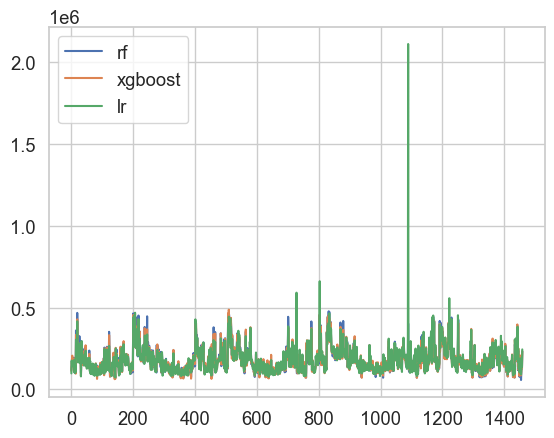

In [289]:
mixed_result.plot()

In [299]:
mixed_result[mixed_result['lr'] > 2110014].lr = (402510.526268 + 219809.203125) /2

/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/1976655415.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mixed_result[mixed_result['lr'] > 2110014].lr = (402510.526268 + 219809.203125) /2


In [309]:
ensembled_prediction = (mixed_result.rf.values + mixed_result.xgboost.values + mixed_result.lr.values) /3

In [310]:
submission_3model = pd.DataFrame({'Id': test.Id, 'SalePrice': ensembled_prediction})

In [311]:
submission_3model.to_csv('submission3.csv',index=False)

### Newpipeline

In [322]:
# Define transformers for numerical and categorical columns
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse = False))
])
# Update categorical and numerical columns
categorical_columns = extraction1.select_dtypes(include=['object', 'category']).columns
numerical_columns = extraction1.select_dtypes(include=['int64', 'float64']).columns

# Remove target variable from numerical columns
numerical_columns = numerical_columns.drop('SalePrice')

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)
    ],remainder = 'passthrough')

# Create a pipeline with the preprocessor
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)])

# Apply the pipeline to your dataset
X_ex1 = extraction1.drop('SalePrice', axis=1)
y = np.log(extraction1['SalePrice']) #normalize dependent variable 
X_ex1_preprocessed = pipeline.fit_transform(X_ex1)

In [331]:
#pca
from sklearn.decomposition import PCA

pca = PCA()
X_pca_pre = pca.fit_transform(X_ex1_preprocessed)

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Choose the number of components based on the explained variance threshold
n_components = np.argmax(cumulative_explained_variance >= 0.95) + 1

#15 components
pca = PCA(n_components=15) 
pipeline_pca = Pipeline(steps=
                        [('preprocessor', preprocessor),
                        ('pca', pca)])

X_pca_ex1 = pipeline_pca.fit_transform(extraction1)
test_ex1_preprocessed = pipeline_pca.fit_transform(extraction_test)

In [332]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_pca_ex1, y, test_size=0.2, random_state=42)

# Define the models
models = {
    'LinearRegression': LinearRegression(),
    'RandomForest': RandomForestRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42)
}

# Define the hyperparameter grids for each model
param_grids = {
    'LinearRegression': {},
    'RandomForest': {
        'n_estimators': [100, 200, 500],
        'max_depth': [None, 10, 30],
        'min_samples_split': [2, 5, 10],
    },
    'XGBoost': {
        'n_estimators': [100, 200, 500],
        'learning_rate': [0.01, 0.1, 0.3],
        'max_depth': [3, 6, 10],
    }
}

# 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Train and tune the models
grids = {}
for model_name, model in models.items():
    #print(f'Training and tuning {model_name}...')
    grids[model_name] = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=cv, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grids[model_name].fit(X_train, y_train)
    best_params = grids[model_name].best_params_
    best_score = np.sqrt(-1 * grids[model_name].best_score_)
    
    print(f'Best parameters for {model_name}: {best_params}')
    print(f'Best RMSE for {model_name}: {best_score}\n')

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for LinearRegression: {}
Best RMSE for LinearRegression: 0.10337758418154683

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for RandomForest: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}
Best RMSE for RandomForest: 0.02753073476808964

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200}
Best RMSE for XGBoost: 0.020501582815515843



In [333]:
y_rf_ex1 = np.exp(grids['RandomForest'].predict(test_ex1_preprocessed))
y_xgboost_ex1 = np.exp(grids['XGBoost'].predict(test_ex1_preprocessed))
y_lr_ex1 = np.exp(grids['LinearRegression'].predict(test_ex1_preprocessed))
mixed_result_ex1 = pd.DataFrame({'rf': y_rf_ex1, 'xgboost': y_xgboost_ex1, 'lr': y_lr_ex1})

<AxesSubplot:>

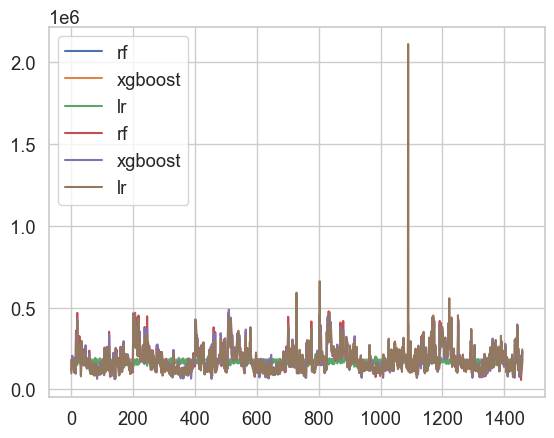

In [338]:
fig,ax = plt.subplots()
mixed_result_ex1.plot(ax=ax)
mixed_result.plot(ax=ax)

In [344]:
ensembled_prediction3 = (y_rf + y_xgboost) / 2

In [345]:
submission_5 = pd.DataFrame({'Id': test.Id, 'SalePrice': ensembled_prediction3})
submission_5.to_csv('submission5.csv',index=False)

# No training wheels, submission 4

In [347]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [350]:
import pandas as pd 
import numpy as np 
import plotly.graph_objects as go
import plotly.express as px
import scipy.stats as stats
from IPython.display import display, HTML

def scrollable_table(df, table_id, title):
    html = f'<h3>{title}</h3>'
    html += f'<div id="{table_id}" style="height:200px; overflow:auto;">'
    html += df.to_html()
    html += '</div>'
    return html

In [351]:
html_train = scrollable_table(df_train, 'training_dateframe', 'Train')
display(HTML(html_train))

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

In [356]:
print(f"Train dataset has {train.shape[1]} columns and {train.shape[0]} rows.")
print(f"Test dataset has {test.shape[1]} columns and {test.shape[0]} rows.")

Train dataset has 81 columns and 1460 rows.
Test dataset has 80 columns and 1459 rows.


In [359]:
print(f"There are {len(set(train.dtypes))} unique data type in the df which are {set(train.dtypes)}.")

There are 3 unique data type in the df which are {dtype('O'), dtype('float64'), dtype('int64')}.


In [365]:
numerical_features = df_train.select_dtypes(include=['int64', 'float64'])
categorical_features = df_train.select_dtypes(include=['O'])

Here is a simple way to kind of show the general structure and distribution of the data using seaborn.

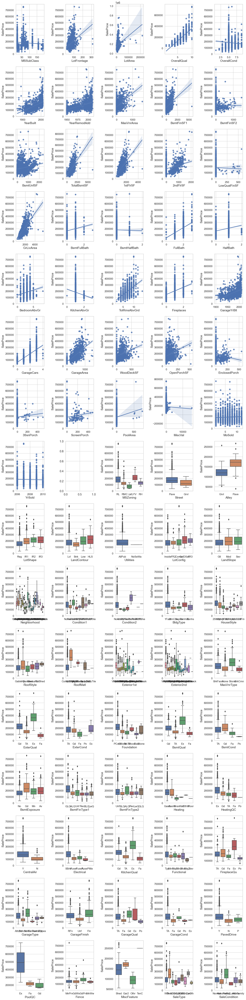

In [366]:
#cluster same datatype together so it will be better visually speaking when we use our plot_all function
train_dtcluster = numerical_features.join(categorical_features) 

def plot_all(df, target_col, num_cols=4):
    num_rows = math.ceil(len(df.columns)/num_cols)
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 4*num_rows))
    sns.set(font_scale=1.2, style='whitegrid')
    for i, col_name in enumerate(df.columns):
        if col_name != target_col.name:
            ax = axes[i // num_cols, i % num_cols]
            if df[col_name].dtype == "O":
                sns.boxplot(x=df[col_name], y=target_col, ax=ax)
            else:
                sns.regplot(x=df[col_name], y=target_col, ax=ax)
            ax.set_xlabel(col_name, fontsize=14)
            ax.set_ylabel(target_col.name, fontsize=14)
            ax.tick_params(axis='both', which='major', labelsize=12)
    plt.tight_layout()
    plt.show()
    
plot_all(train_dtcluster.drop('Id',axis=1), train.SalePrice, num_cols=5)

{MSSubClass, OverallQual, OverallCond, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, 
BedroomAbvGr, KitchenAbvGr, TotRmsAbvGrd, Fireplaces, GarageCars, MoSold, YrSold}
appears to be categorical data, so we are going to change it here

In [370]:
df_train = df_train[['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath', 'BsmtHalfBath', 
          'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 
          'Fireplaces', 'GarageCars', 'MoSold', 'YrSold']].astype(str)

In [376]:
df = pd.read_csv('train.csv')

In [387]:
from scipy.stats import skew

cat_feat = df.select_dtypes(include = ["object"]).columns
num_feat = df.select_dtypes(exclude = ["object"]).columns
train_cat = df[cat_feat]
train_num = df[num_feat]

In [388]:

skewness = train_num.apply(lambda x: skew(x))
skewness = skewness[abs(skewness) > 0.5]
skewed_features = skewness.index
skewed_features
np.log(train_num[skewed_features])

/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


,MSSubClass,LotArea,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,TotRmsAbvGrd,Fireplaces,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
0,4.094345,9.041922,1.609438,7.602401,7.602401,6.559615,-inf,5.010635,6.752270,6.752270,...,2.079442,-inf,-inf,4.110874,-inf,-inf,-inf,-inf,-inf,12.247694
1,2.995732,9.169518,2.079442,7.588830,7.588830,6.885510,-inf,5.648974,7.140453,7.140453,...,1.791759,0.000000,5.697093,-inf,-inf,-inf,-inf,-inf,-inf,12.109011
2,4.094345,9.328123,1.609438,7.601402,7.601902,6.186209,-inf,6.073045,6.824374,6.824374,...,1.791759,0.000000,-inf,3.737670,-inf,-inf,-inf,-inf,-inf,12.317167
3,4.248495,9.164296,1.609438,7.557473,7.585789,5.375278,-inf,6.291569,6.628041,6.867974,...,1.945910,0.000000,-inf,3.555348,5.605802,-inf,-inf,-inf,-inf,11.849398
4,4.094345,9.565214,1.609438,7.600902,7.600902,6.484635,-inf,6.194405,7.043160,7.043160,...,2.197225,0.000000,5.257495,4.430817,-inf,-inf,-inf,-inf,-inf,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,4.094345,8.976768,1.609438,7.600402,7.600902,-inf,-inf,6.859615,6.859615,6.859615,...,1.945910,0.000000,-inf,3.688879,-inf,-inf,-inf,-inf,-inf,12.072541
1456,2.995732,9.486076,1.791759,7.589842,7.594884,6.672033,5.093750,6.378426,7.340836,7.636752,...,1.945910,0.693147,5.855072,-inf,-inf,-inf,-inf,-inf,-inf,12.254863
1457,4.248495,9.109636,2.197225,7.570959,7.603898,5.616771,-inf,6.776507,7.049255,7.080026,...,2.197225,0.693147,-inf,4.094345,-inf,-inf,-inf,-inf,7.824046,12.493130
1458,2.995732,9.181632,1.791759,7.575585,7.598900,3.891820,6.936343,-inf,6.982863,6.982863,...,1.609438,-inf,5.902633,-inf,4.718499,-inf,-inf,-inf,-inf,11.864462


In [ ]:
skewed_features = skewness.index
train_num[skewed_features] = np.log(train_num[skewed_features])

In [390]:
alpha = np.logspace(-3,3,7)

In [391]:
np.logspace(-3,3,7)

array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03])

# Submission 7

In [587]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import skew

train = pd.read_csv("train.csv").drop("Id",axis=1)

In [586]:
class imputer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        imputer_num = SimpleImputer(strategy='mean')
        imputer_cat = SimpleImputer(strategy='constant', fill_value='missing')
        for col in X.columns:
            if X[col].dtype == 'O':
                X[col] = imputer_cat.fit_transform(X[col].values.reshape(-1,1))[:,0] 
            else:
                X[col] = imputer_num.fit_transform(X[col].values.reshape(-1,1))[:,0] 
        return X

class log_skewedfeatures(BaseEstimator, TransformerMixin): #apply to numerical features
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        skewness = X.apply(lambda x: skew(x))
        skewness = skewness[abs(skewness) > 0.5]
        skewed_features = skewness.index
        X[skewed_features] = np.log1p(X[skewed_features])
        return X
    
class PCA_transformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        pca = PCA()
        pca = PCA(n_components=249) #retain 95% variance
        X_pca = pca.fit_transform(X)
        return X_pca
    
    
class FeatureEncode(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        cat_col = X.select_dtypes(include='O').columns.values
        encoder = OneHotEncoder()
        for col in cat_col:
            matrix = encoder.fit_transform(X[col].values.reshape(-1,1)).toarray()
            column_values = list(set(list(train[col].unique()) + list(test[col].unique())))
            print(column_values)
            column_ = [str(c) + '_' + col for c in column_values]
            for i in range(len(matrix.T)):
                X[column_[i]] = matrix.T[i]
            X = X.drop([col],axis=1)
            
        return X
    
class dummiesEncode(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        cat_col = X.select_dtypes(include='O').columns.values
        for col in cat_col:
            X[col] = X[col].apply(lambda x: str(x) + str(col))
        
        dummies_train = pd.get_dummies(X[cat_col])
        X.drop(final_train, axis=1)
        X = X.join(final_train)
        final_train, final_test = train.align(test, join='inner', axis=1)

In [588]:
#Transfer the columns to categorical data
transfer_col = ['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath', 
                'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 
                'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 
                'MoSold', 'YrSold']
for i in transfer_col:
    train[i] = train[i].astype(str)

train = train[train.GrLivArea < 4000] #remove outliners

X = train.drop(["SalePrice", "PoolQC", "MiscFeature", "Alley", "Fence", "Utilities"] ,axis=1)
y = np.log(train.SalePrice)

numerical_columns = X.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = X.select_dtypes(include=['object']).columns


numerical_transformer = Pipeline(steps=[
    ('imputer', imputer()),
#     ('log_feature', log_skewedfeatures()),
    ('scaler', StandardScaler())
])
categorical_transformer = Pipeline(steps=[
    ('imputer', imputer()),
    ('featureencoder', FeatureEncode())
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)
    ],remainder = 'passthrough')

# Create a pipeline with the preprocessor
pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),])
#         ('pca', PCA_transformer())])

X_preprocessed = pipeline.fit_transform(X)

['120', '190', '45', '85', '20', '160', '75', '40', '180', '50', '30', '80', '150', '60', '70', '90']
[nan, 'RM', 'FV', 'RH', 'RL', 'C (all)']
['Pave', 'Grvl']
['IR2', 'IR3', 'Reg', 'IR1']
['HLS', 'Lvl', 'Bnk', 'Low']
['FR3', 'Inside', 'CulDSac', 'Corner', 'FR2']
['Mod', 'Sev', 'Gtl']
['NWAmes', 'NridgHt', 'Crawfor', 'NoRidge', 'SawyerW', 'ClearCr', 'Mitchel', 'OldTown', 'Veenker', 'NAmes', 'IDOTRR', 'Gilbert', 'MeadowV', 'Sawyer', 'BrkSide', 'BrDale', 'NPkVill', 'Blmngtn', 'StoneBr', 'Somerst', 'Blueste', 'Edwards', 'SWISU', 'CollgCr', 'Timber']
['Feedr', 'PosA', 'PosN', 'RRNn', 'Norm', 'RRAn', 'RRAe', 'RRNe', 'Artery']
['Feedr', 'RRAe', 'PosA', 'RRNn', 'PosN', 'RRAn', 'Norm', 'Artery']
['TwnhsE', 'Duplex', 'Twnhs', '1Fam', '2fmCon']
['SFoyer', '1.5Unf', '1.5Fin', '2.5Unf', '2Story', '1Story', '2.5Fin', 'SLvl']
['9', '1', '3', '10', '5', '8', '4', '6', '7', '2']
['9', '1', '3', '8', '5', '4', '6', '7', '2']
['Flat', 'Gable', 'Hip', 'Gambrel', 'Mansard', 'Shed']
['Membran', 'Metal', 'C

/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/4292549677.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/4292549677.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/4292549677.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perf

['2', '1', '0', '3']
[nan, 'Fa', 'Ex', 'Gd', 'TA']
['9', '14', '3', '12', '10', '5', '8', '11', '4', '6', '13', '15', '7', '2']
[nan, 'Maj1', 'Min1', 'Mod', 'Sev', 'Min2', 'Typ', 'Maj2']
['1', '0', '3', '4', '2']
[nan, 'Fa', 'Ex', 'Gd', 'TA', 'Po']
[nan, 'BuiltIn', '2Types', 'Detchd', 'CarPort', 'Basment', 'Attchd']
['RFn', 'Fin', 'Unf', nan]
['1', '0', '4.0', '3', 'nan', '5.0', '4', '0.0', '2.0', '1.0', '2', '3.0']
[nan, 'Fa', 'Ex', 'Gd', 'TA', 'Po']
[nan, 'Fa', 'Ex', 'Gd', 'TA', 'Po']
['P', 'Y', 'N']
['9', '1', '3', '12', '10', '5', '8', '11', '4', '6', '7', '2']
['2009', '2007', '2010', '2006', '2008']
['Con', 'ConLD', nan, 'ConLw', 'Oth', 'COD', 'WD', 'CWD', 'New', 'ConLI']
['AdjLand', 'Partial', 'Abnorml', 'Alloca', 'Family', 'Normal']


/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/4292549677.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/4292549677.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/4292549677.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perf

In [589]:
pd.DataFrame(data=X_preprocessed)

,0,1,2,3,4,5,6,7,8,9,...,358,359,360,361,362,363,364,365,366,367
0,-0.224620,-0.202770,1.053769,0.880629,0.531208,0.625446,-0.289082,-0.943320,-0.472456,-0.815613,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.493259,-0.086107,0.159469,-0.427190,-0.577452,1.257846,-0.289082,-0.640184,0.512947,0.284120,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,-0.081044,0.081281,0.987524,0.832191,0.338890,0.113946,-0.289082,-0.300852,-0.317122,-0.642256,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,-0.463912,-0.091179,-1.860986,-0.717817,-0.577452,-0.513805,-0.289082,-0.061058,-0.715166,-0.531200,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.684694,0.386636,0.954402,0.735316,1.402298,0.506871,-0.289082,-0.174169,0.228976,-0.032798,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,-0.368195,-0.256842,0.921280,0.735316,-0.577452,-1.016005,-0.289082,0.873235,-0.237027,-0.552869,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1452,0.732552,0.276566,0.225713,0.154063,0.095663,0.820746,0.720413,0.049790,1.192535,2.480877,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1453,-0.176761,-0.142714,-0.999809,1.025942,-0.577452,-0.376629,-0.289082,0.701307,0.245966,0.083676,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1454,-0.081044,-0.074237,-0.701709,0.541565,-0.577452,-0.902080,6.083741,-1.282652,0.066360,-0.214281,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [575]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, 
                                                    test_size=0.2, random_state=0)

def rmse_cv(model):
    cv_score = cross_val_score(model, X_preprocessed, y, cv=5, 
                               scoring='neg_mean_squared_error')
    rmse = np.sqrt(-cv_score).mean()
    return rmse

In [483]:
models_raw = {
    'LinearReg': LinearRegression(),
    'Ridge': RidgeCV(),
    'Lasso': LassoCV(alphas=np.logspace(-4,4,9)),
    'ElasticNet': ElasticNetCV(),
    'XGBoost': XGBRegressor(),
    'RandomForest': RandomForestRegressor(),
    'SVM_R': SVR()
}


for name, model in models_raw.items():
    print(f"{name} RMSE: {rmse_cv(model)}")

LinearReg RMSE: 1088839137.6235988


/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alp

Ridge RMSE: 0.11658375508697967
Lasso RMSE: 0.11637798084599042
ElasticNet RMSE: 0.11396269231309027
XGBoost RMSE: 0.13623608390031708
RandomForest RMSE: 0.1415930694523735
SVM_R RMSE: 0.1393327990111439


In [576]:
LinearReg = LinearRegression()
Ridge = RidgeCV(alphas=[0.1, 1.0, 10.0], fit_intercept=True)
Lasso = LassoCV(alphas=np.logspace(-4,4,9), fit_intercept=True, max_iter=500)
ElasticNet = ElasticNetCV(alphas=[0.001, 0.01, 0.1], fit_intercept=True, l1_ratio=0.01, max_iter=500)
XGBoost = XGBRegressor(learning_rate=0.05, max_depth=3, min_child_weight=10, n_estimators=1000, reg_lambda=0.1)
RandomForest = RandomForestRegressor(max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=1000)
SVM_R = SVR(C=0.05, epsilon=0.01, gamma='scale', kernel='linear')

In [577]:
base_models = {
    'LinearReg': LinearReg,
    'Ridge': Ridge,
    'Lasso': Lasso,
    'ElasticNet': ElasticNet,
    'XGBoost': XGBoost,
#     'RandomForest': RandomForest,
    'SVM_R': SVM_R,
}

for model_name, model in base_models.items():
    model.fit(X_train, y_train)
    model_cvscore = np.sqrt(-cross_val_score(model, X_preprocessed, y, cv=20, scoring='neg_mean_squared_error')).mean()
    print(f"{model_name} score: {model_cvscore}")

LinearReg score: 0.1189282339507864
Ridge score: 0.11391737445536534
Lasso score: 0.11614416407653683
ElasticNet score: 0.11496772302543548
XGBoost score: 0.1301600182650789
SVM_R score: 0.11495488638991211


In [578]:
for model_name, model in base_models.items():
    pred = model.predict(X_test)
    print(f"{model_name} score: {np.sqrt(mean_squared_error(pred, y_test))}")

LinearReg score: 0.11794454492774761
Ridge score: 0.10324663723417146
Lasso score: 0.10783600098408926
ElasticNet score: 0.10362182611341916
XGBoost score: 0.12031407929953439
SVM_R score: 0.1074213472346801


In [584]:
test = pd.read_csv("test.csv")
test_id = test.Id.values

transfer_col = ['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath', 
                'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 
                'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 
                'MoSold', 'YrSold']
for i in transfer_col:
    test[i] = test[i].astype(str)

X_sub = test.drop(["Id", "PoolQC", "MiscFeature", "Alley", "Fence", "Utilities"] ,axis=1)
X_sub_preprocessed = pipeline.fit_transform(X_sub)

MSSubClass
MSZoning
Street
LotShape
LandContour
LotConfig
LandSlope
Neighborhood
Condition1
Condition2
BldgType
HouseStyle
OverallQual
OverallCond
RoofStyle
RoofMatl
Exterior1st
Exterior2nd
MasVnrType
ExterQual
ExterCond
Foundation
BsmtQual
BsmtCond
BsmtExposure
BsmtFinType1
BsmtFinType2
Heating
HeatingQC
CentralAir
Electrical
BsmtFullBath
BsmtHalfBath
FullBath
HalfBath
BedroomAbvGr
KitchenAbvGr
KitchenQual
TotRmsAbvGrd
Functional
Fireplaces
FireplaceQu
GarageType


/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/3471365271.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/3471365271.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/3471365271.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perf

GarageFinish
GarageCars
GarageQual
GarageCond
PavedDrive
MoSold
YrSold
SaleType
SaleCondition


/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/3471365271.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/3471365271.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[column_[i]] = matrix.T[i]
/var/folders/fm/rwn89n9x1b94vk3rbr72zvtw0000gn/T/ipykernel_35963/3471365271.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perf

In [585]:
pd.DataFrame(data=X_sub_preprocessed)

,0,1,2,3,4,5,6,7,8,9,...,354,355,356,357,358,359,360,361,362,363
0,0.555587,0.363929,-0.340945,-1.072885,-0.570108,0.063295,0.517348,-0.650619,-0.370808,-0.654561,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.604239,0.897861,-0.439695,-1.214908,0.041273,1.063392,-0.297903,-0.339378,0.639144,0.433298,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.263676,0.809646,0.844059,0.678742,-0.570108,0.773254,-0.297903,-0.954994,-0.266876,-0.574165,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.458284,0.032064,0.876976,0.678742,-0.456889,0.357829,-0.297903,-0.527038,-0.271395,-0.579190,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,-1.244533,-0.971808,0.679475,0.394694,-0.570108,-0.387298,-0.297903,1.058917,0.528434,0.310192,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-2.314875,-1.591330,-0.044694,-0.646813,-0.570108,-0.965376,-0.297903,-0.018983,-1.129968,-1.533893,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1455,-2.314875,-1.599808,-0.044694,-0.646813,-0.570108,-0.411477,-0.297903,-0.595694,-1.129968,-1.533893,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1456,4.447740,2.055150,-0.373861,0.584059,-0.570108,1.724994,-0.297903,-1.268524,0.401907,0.169499,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1457,-0.320147,0.125527,0.679475,0.394694,-0.570108,-0.224645,-0.297903,0.047384,-0.303026,-0.468645,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [579]:
final_models = {
    'LinearRegression': LinearReg,
    'Ridge': Ridge,
    'Lasso': Lasso,
    'ElasticNet': ElasticNet,
    'XGBoost': XGBoost,
#     'RandomForest': RandomForest,
    'SVR': SVM_R,
#     'Voting1': voting_model,
#     'Voting2': voting_model2,
#     'Stack': ensemble
}
for model_name, model in final_models.items():
    submission_df = pd.DataFrame({'Id': test_id, 'SalePrice': np.exp(model.predict(X_sub_preprocessed))})
    submission_name = 'submission_' + model_name + '.csv'
    submission_df.to_csv(submission_name, index=False)

In [507]:
train.select_dtypes(include='O').columns

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'YrSold', 'SaleType',
       'SaleCondition'],
      dtype='object')

In [544]:
train_count = []
test_count = []
for col in cat_col:
    train_count.append(train[col].nunique())
    test_count.append(test[col].nunique())
    
cat_compare = pd.DataFrame({'train': train_count, 'test': test_count}, index=cat_col)
cat_diff_val = cat_compare[cat_compare.train != cat_compare.test]
cat_diff_val.index.values


array(['MSSubClass', 'Utilities', 'Condition2', 'HouseStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'Heating', 'Electrical',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'GarageQual', 'PoolQC',
       'MiscFeature'], dtype=object)

In [546]:
cat_diff_val

,train,test
MSSubClass,15,16
Utilities,2,1
Condition2,8,5
HouseStyle,8,7
RoofMatl,7,4
Exterior1st,15,13
Exterior2nd,16,15
Heating,6,4
Electrical,5,4
BsmtFullBath,4,5


In [556]:
list(set(list(train.MSSubClass.unique()) + list(test.MSSubClass.unique())))

['120',
 '190',
 '45',
 '85',
 '20',
 '160',
 '75',
 '40',
 '180',
 '50',
 '30',
 '80',
 '150',
 '60',
 '70',
 '90']

In [689]:
train_test = pd.read_csv('train.csv').drop('Id',axis=1)
test_test = pd.read_csv('test.csv')

In [690]:
#Transfer the columns to categorical data
transfer_col = ['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath', 
                'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 
                'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 
                'MoSold', 'YrSold']
for i in transfer_col:
    train_test[i] = train_test[i].astype(str)

train_test = train_test[train_test.GrLivArea < 4000] #remove outliners

X = train_test.drop(["SalePrice", "PoolQC", "MiscFeature", "Alley", "Fence", "Utilities"] ,axis=1)
y = np.log(train_test.SalePrice)

num_col = X.select_dtypes(include=['int64', 'float64']).columns
cat_col = X.select_dtypes(include=['object']).columns

imputer_num = SimpleImputer(strategy='mean')
imputer_cat = SimpleImputer(strategy='constant', fill_value='missing')

for col in X.columns:
    if X[col].dtype == 'O':
        X[col] = imputer_cat.fit_transform(X[col].values.reshape(-1,1))[:,0] 
    else:
        X[col] = imputer_num.fit_transform(X[col].values.reshape(-1,1))[:,0] 

for col in cat_col:
    X[col] = X[col].apply(lambda x: str(x) + str(col))
    
skewness = X[num_col].apply(lambda x: skew(x))
skewness = skewness[abs(skewness) > 0.5]
skewed_features = skewness.index
X[skewed_features] = np.log1p(X[skewed_features])

X[num_col] = StandardScaler().fit_transform(X[num_col])

dummies_train = pd.get_dummies(X[cat_col])
X = X.drop(cat_col, axis=1)
X = X.join(dummies_train)

X_preprocessed_train = X

In [691]:
#Transfer the columns to categorical data
transfer_col = ['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath', 
                'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 
                'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 
                'MoSold', 'YrSold']
for i in transfer_col:
    test_test[i] = test_test[i].astype(str)

X = test_test.drop(["Id", "PoolQC", "MiscFeature", "Alley", "Fence", "Utilities"] ,axis=1)

num_col = X.select_dtypes(include=['int64', 'float64']).columns
cat_col = X.select_dtypes(include=['object']).columns

#
imputer_num = SimpleImputer(strategy='mean')
imputer_cat = SimpleImputer(strategy='constant', fill_value='missing')

for col in X.columns:
    if X[col].dtype == 'O':
        X[col] = imputer_cat.fit_transform(X[col].values.reshape(-1,1))[:,0] 
    else:
        X[col] = imputer_num.fit_transform(X[col].values.reshape(-1,1))[:,0] 

for col in cat_col:
    X[col] = X[col].apply(lambda x: str(x) + str(col))

skewness = X[num_col].apply(lambda x: skew(x))
skewness = skewness[abs(skewness) > 0.5]
skewed_features = skewness.index
X[skewed_features] = np.log1p(X[skewed_features])

X[num_col] = StandardScaler().fit_transform(X[num_col])


dummies_test = pd.get_dummies(X[cat_col])
X = X.drop(cat_col, axis=1)
final_train, final_test = dummies_train.align(dummies_test, join='left', axis=1)
X = X.join(final_test)
X = X.fillna(0)

X_preprocessed_test = X

In [684]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X_train, X_test, y_train, y_test = train_test_split(X_preprocessed_train, y, 
                                                    test_size=0.2, random_state=0)

def rmse_cv(model):
    cv_score = cross_val_score(model, X_preprocessed, y, cv=5, 
                               scoring='neg_mean_squared_error')
    rmse = np.sqrt(-cv_score).mean()
    return rmse

In [685]:
LinearReg = LinearRegression()
Ridge = RidgeCV(alphas=[0.1, 1.0, 10.0], fit_intercept=True)
Lasso = LassoCV(alphas=np.logspace(-4,4,9), fit_intercept=True)
ElasticNet = ElasticNetCV(alphas=[0.001, 0.01, 0.1], fit_intercept=True, l1_ratio=0.01)
XGBoost = XGBRegressor(learning_rate=0.05, max_depth=3, min_child_weight=10, n_estimators=1000, reg_lambda=0.1)
RandomForest = RandomForestRegressor(max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=1000)
SVM_R = SVR(C=0.05, epsilon=0.01, gamma='scale', kernel='linear')

In [686]:
base_models = {
    'LinearReg': LinearReg,
    'Ridge': Ridge,
    'Lasso': Lasso,
    'ElasticNet': ElasticNet,
    'XGBoost': XGBoost,
#     'RandomForest': RandomForest,
    'SVM_R': SVM_R,
}

for model_name, model in base_models.items():
    model.fit(X_train, y_train)
    model_cvscore = np.sqrt(-cross_val_score(model, X_preprocessed_train, y, cv=20, scoring='neg_mean_squared_error')).mean()
    print(f"{model_name} score: {model_cvscore}")

LinearReg score: 2132033227.1971557


/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alpha ** -1)
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning: invalid value encountered in reciprocal
  w = ((singvals_sq + alpha) ** -1) - (alp

Ridge score: 0.11409963998643671
Lasso score: 0.11510863114939826


/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.11669888807303153, tolerance: 0.018146742943423336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.05701140529323023, tolerance: 0.017774302994208718
  model = cd_fast.enet_coordinate_descent_gram(
/Users/jadonng/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.06395043075504336, tolerance: 0.01787258589217707
  model = cd_fast.enet_coordinate_descent_gram(
/Users/jadonng/opt/anaconda3/lib/pytho

ElasticNet score: 0.11444489454667195
XGBoost score: 0.12291829417222185
SVM_R score: 0.11493663906812276


In [687]:
for model_name, model in base_models.items():
    pred = model.predict(X_test)
    print(f"{model_name} score: {np.sqrt(mean_squared_error(pred, y_test))}")

LinearReg score: 0.11415276785877648
Ridge score: 0.11336666785635012
Lasso score: 0.11376917809519388
ElasticNet score: 0.11318088452009632
XGBoost score: 0.13059783780800835
SVM_R score: 0.1094758562565082


In [692]:
final_models = {
    'LinearRegression': LinearReg,
    'Ridge': Ridge,
    'Lasso': Lasso,
    'ElasticNet': ElasticNet,
    'XGBoost': XGBoost,
#     'RandomForest': RandomForest,
    'SVR': SVM_R,
#     'Voting1': voting_model,
#     'Voting2': voting_model2,
#     'Stack': ensemble
}
for model_name, model in final_models.items():
    submission_df = pd.DataFrame({'Id': test_id, 'SalePrice': np.exp(model.predict(X_preprocessed_test))})
    submission_name = 'submission_pca_' + model_name + '.csv'
    submission_df.to_csv(submission_name, index=False)

In [711]:
df1 = pd.DataFrame({'1': [1,1,1,1],'2': [1,1,1,1], '3': [1,1,1,1]})
df2 = pd.DataFrame({'1': [2,2,2,2], '2': [2,2,3,2]})

In [712]:
df1

,1,2,3
0,1,1,1
1,1,1,1
2,1,1,1
3,1,1,1


In [713]:
df2

,1,2
0,2,2
1,2,2
2,2,3
3,2,2


In [714]:
left, right=df1.align(df2, join='left', axis=1)

In [715]:
right

,1,2,3
0,2,2,NaN
1,2,2,NaN
2,2,3,NaN
3,2,2,NaN
